In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from itertools import combinations
import anndata
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import random
import scvi

import plotting_functions as pf

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
Global seed set to 0


In [2]:
plate_palette = sns.color_palette("husl", n_colors=4)
sex_palette = ['hotpink','dodgerblue']
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


# QC plotting - 200 UMI merged adata

In [3]:
adata = sc.read("../IGVF_analysis/preprocessed_tissues/Adrenalpreprocessed.h5ad")


In [5]:
adata

AnnData object with n_obs × n_vars = 1910440 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'doublet_scores', 'batch'
    var: 'gene_name'
    layers: 'raw_counts'

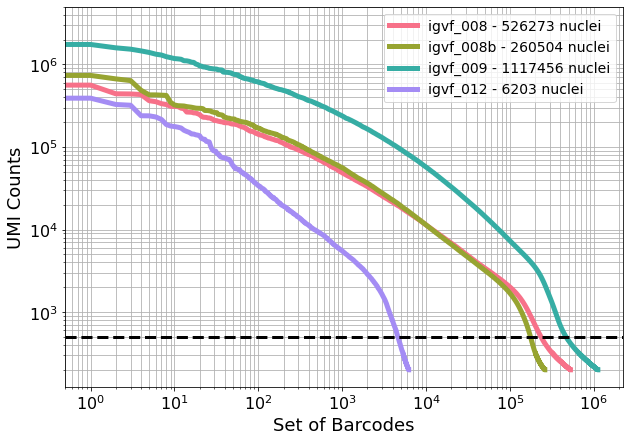

In [6]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

In [7]:
# set var names to be gene names, not gene ID
adata.var_names  = adata.var['gene_name']
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


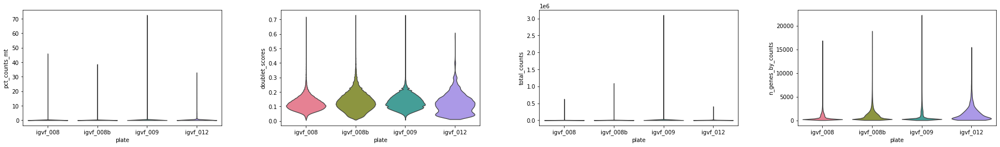

In [8]:

sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

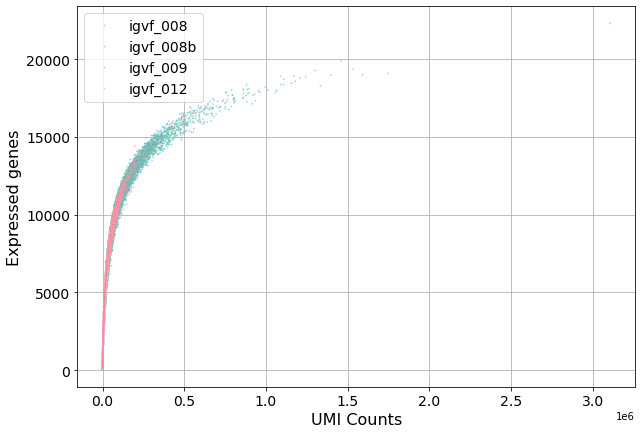

In [9]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

In [10]:
adatas = adata[(adata.obs['total_counts'] < 10000) & (adata.obs['n_genes_by_counts'] < 2000), :]


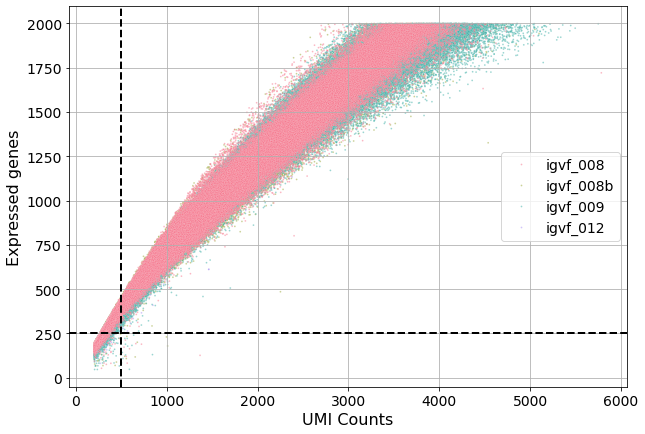

In [11]:
pf.plot_genes_by_counts(adatas, category_column='plate', figsize=(10, 7))

plt.axvline(x=500, color='k', linestyle='--', linewidth=2)
plt.axhline(y=250, color='k', linestyle='--', linewidth=2)

plt.show()

In [12]:
adatas[(adatas.obs['total_counts'] > 500) & (adatas.obs['n_genes_by_counts'] < 250), :]


View of AnnData object with n_obs × n_vars = 27 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'raw_counts'

# QC plotting - filtered data
500 UMI, 250 genes, 1% mito, 0.25 doublet score


In [4]:
adata = sc.read("../IGVF_analysis/tissue_processed_500umi/Adrenal_processed.h5ad")


In [5]:
adata.obs.head()

,bc,bc1_sequence,bc2_sequence,bc3_sequence,subpool,bc1_well,bc2_well,bc3_well,Mouse_Tissue_ID,alias_tissue1,...,mult_genotype,n_counts,doublet_scores,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
cellID,,,,,,,,,,,,,,,,,,,,,
A12_B1_A2_Sublibrary_2_igvf_008b,AAACATCGAACAACCAACTCCTGC,ACTCCTGC,AACAACCA,AAACATCG,Sublibrary_2,A12,B1,A2,AB_M2_08,ali-mortazavi:019_B6J_10M_08_UBERON_0002369,...,B6J_NODJ,986.0,0.164948,0,711,711,986.0,0.0,0.000000,0
A12_B9_A2_Sublibrary_2_igvf_008b,AAACATCGACGCTCGAACTCCTGC,ACTCCTGC,ACGCTCGA,AAACATCG,Sublibrary_2,A12,B9,A2,AB_M2_08,ali-mortazavi:019_B6J_10M_08_UBERON_0002369,...,B6J_NODJ,2559.0,0.244755,0,1511,1511,2559.0,0.0,0.000000,2
A12_D11_A2_Sublibrary_2_igvf_008b,AAACATCGCAAGACTAACTCCTGC,ACTCCTGC,CAAGACTA,AAACATCG,Sublibrary_2,A12,D11,A2,AB_M2_08,ali-mortazavi:019_B6J_10M_08_UBERON_0002369,...,B6J_NODJ,2500.0,0.244755,0,1468,1468,2500.0,0.0,0.000000,7
A12_C11_A2_Sublibrary_2_igvf_008b,AAACATCGCATACCAAACTCCTGC,ACTCCTGC,CATACCAA,AAACATCG,Sublibrary_2,A12,C11,A2,AB_M2_08,ali-mortazavi:019_B6J_10M_08_UBERON_0002369,...,B6J_NODJ,9535.0,0.212500,0,4229,4229,9535.0,24.0,0.251704,10
A12_D7_A2_Sublibrary_2_igvf_008b,AAACATCGCTCAATGAACTCCTGC,ACTCCTGC,CTCAATGA,AAACATCG,Sublibrary_2,A12,D7,A2,AB_M2_08,ali-mortazavi:019_B6J_10M_08_UBERON_0002369,...,B6J_NODJ,1041.0,0.106870,0,788,788,1041.0,0.0,0.000000,11


In [6]:
adata.layers

Layers with keys: raw_counts

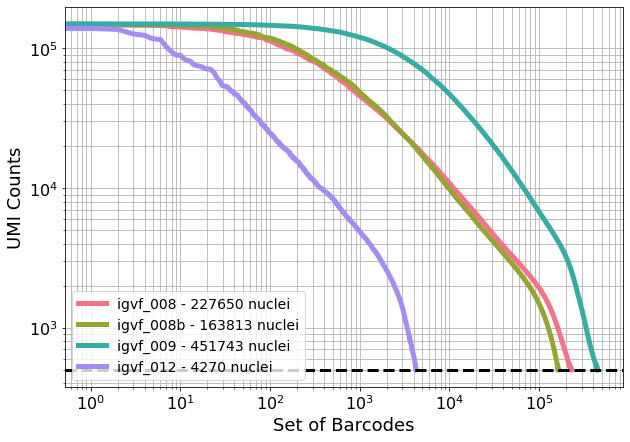

In [7]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

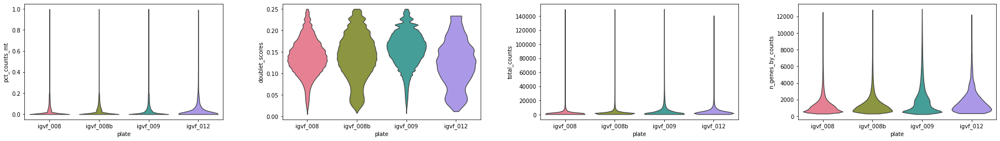

In [8]:
sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

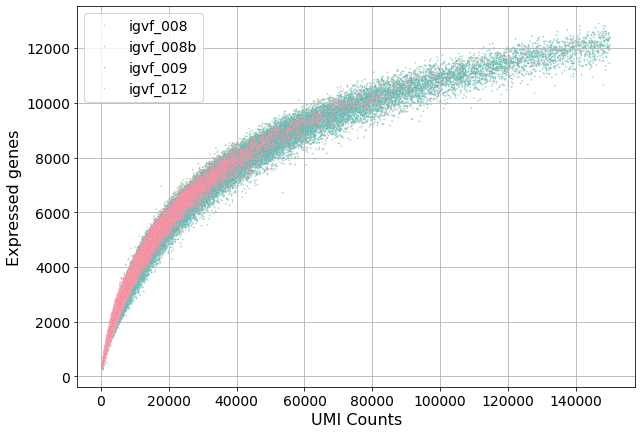

In [9]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

In [10]:
print(adata.obs['Genotype'].value_counts())

adata = adata[adata.obs['Genotype'] != "tie",:]

print(adata.obs['Genotype'].value_counts())

Genotype
NZOJ      135003
WSBJ      134749
NODJ      123055
CASTJ     103224
129S1J     91797
B6J        89526
PWKJ       88429
AJ         81279
tie          418
Name: count, dtype: int64
Genotype
NZOJ      135003
WSBJ      134749
NODJ      123055
CASTJ     103224
129S1J     91797
B6J        89526
PWKJ       88429
AJ         81279
Name: count, dtype: int64


In [11]:
adata

View of AnnData object with n_obs × n_vars = 847062 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'le

# Check clustering
Plate, sex, genotype

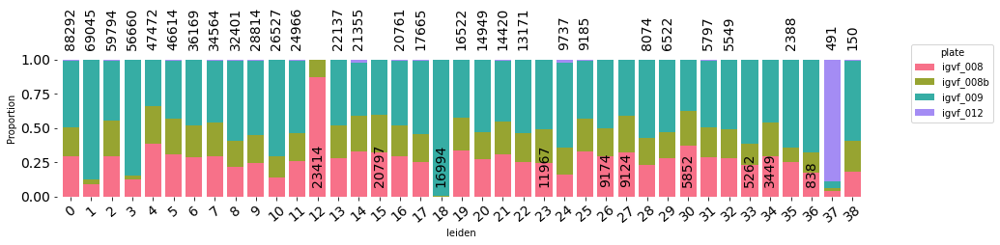

In [12]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=False, fsize = (15,3), 
                            annotations = True)


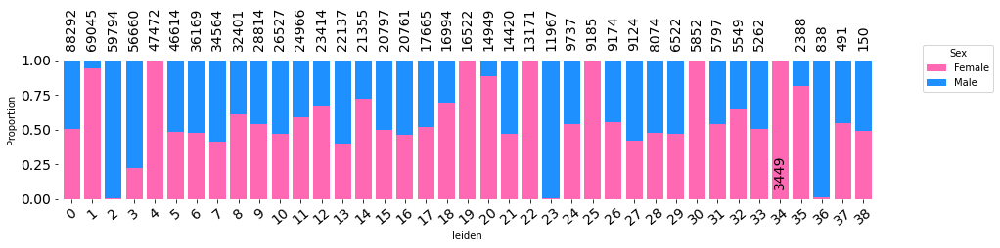

In [13]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Sex',
                            flip=False, fsize = (15,3), 
                            annotations = True)


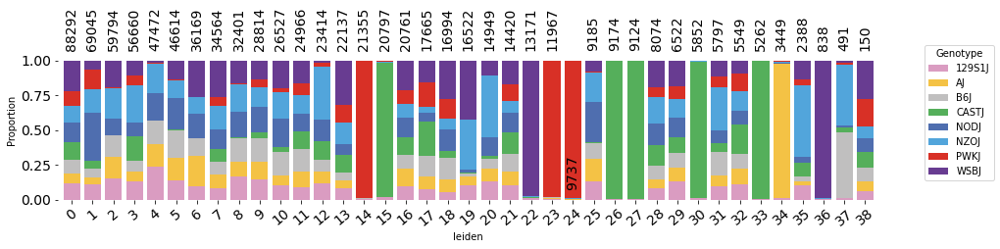

In [14]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/apps/python/3.8.0/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


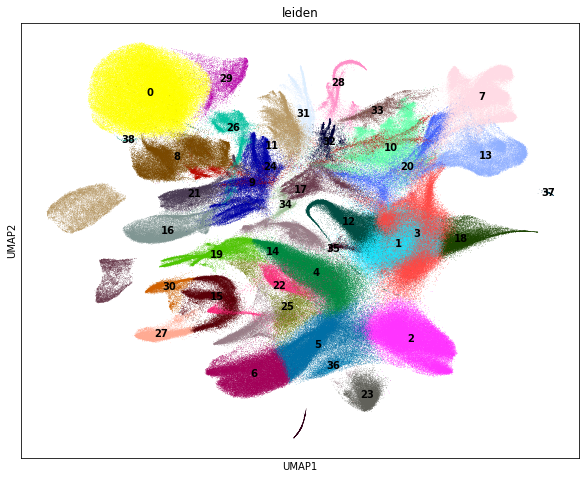

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


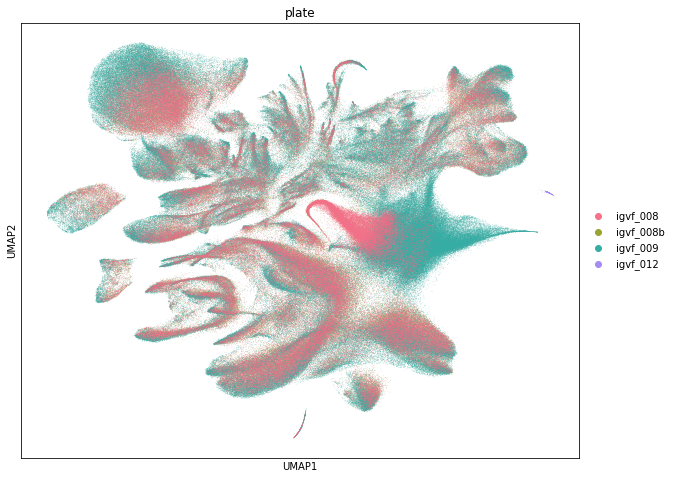

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


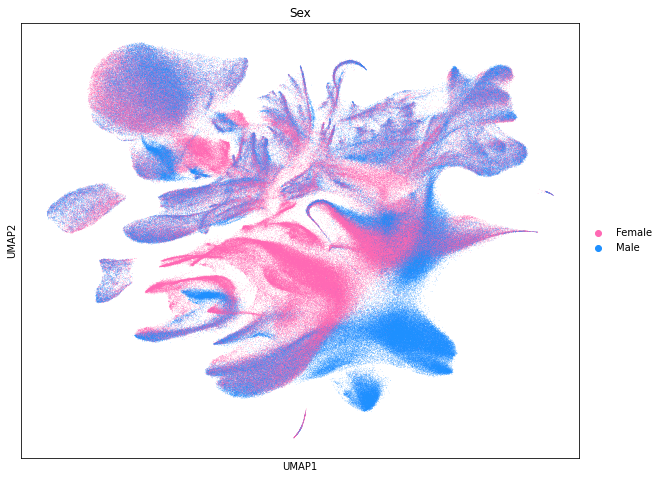

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


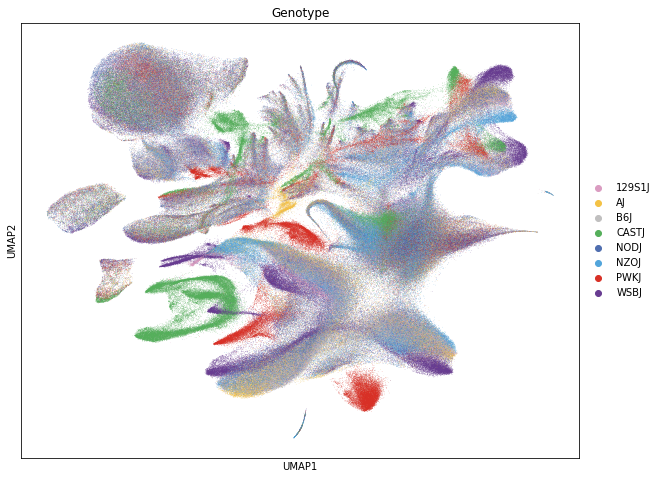

In [15]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Sex'], size = 0.8, palette = sex_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)



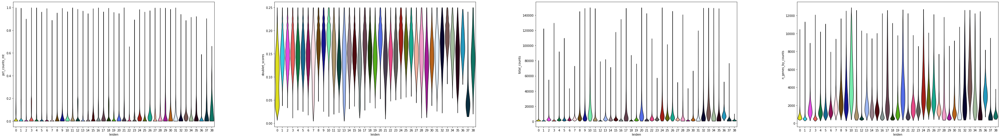

In [16]:
sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "leiden", 
             jitter=0.4, multi_panel=True, size=0)

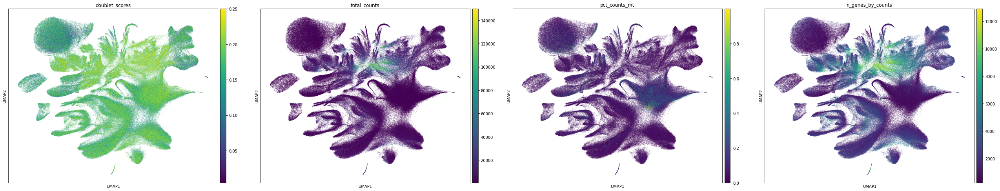

In [19]:
sc.pl.umap(adata, color=['doublet_scores','total_counts','pct_counts_mt','n_genes_by_counts'], size=1)


In [21]:
adata.var_names  = adata.var['gene_name']


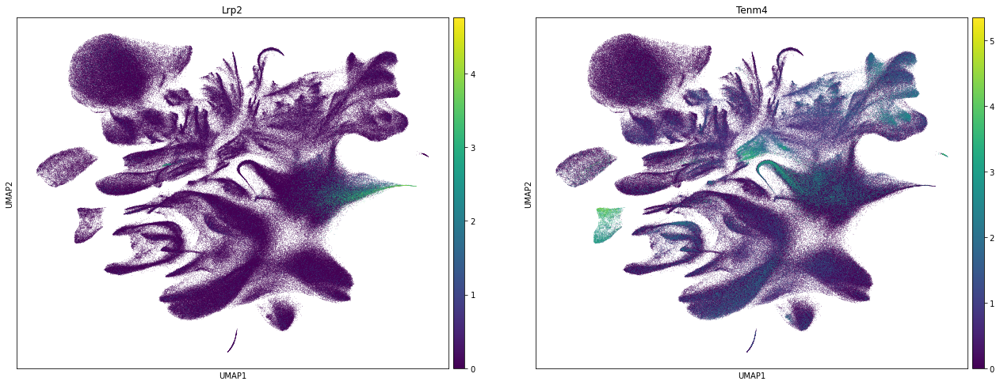

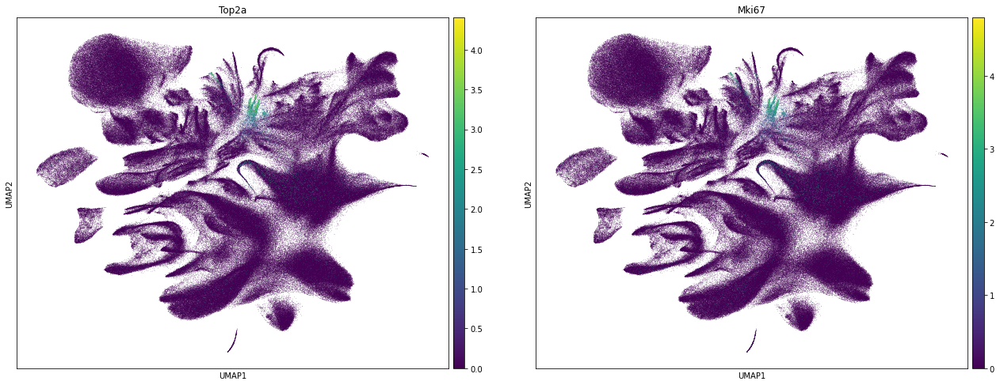

In [23]:
sc.pl.umap(adata, color=['Lrp2','Tenm4'], size=1) # highly expressed kidney and female gonad markers

sc.pl.umap(adata, color=['Top2a','Mki67'], size=1) # highly expressed kidney and female gonad markers



# Remove large low-quality clusters and re-cluster

In [24]:
adata = adata[~adata.obs['leiden'].isin(["1","3","18","12","37"])]



In [25]:
adata


View of AnnData object with n_obs × n_vars = 680458 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'le

In [ ]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

adatas = adata[:, adata.var.highly_variable]




In [ ]:
sc.pp.regress_out(adatas, ['pct_counts_mt','n_genes_by_counts'])
sc.pp.scale(adatas, max_value=10)

sc.tl.pca(adatas, svd_solver='arpack', use_highly_variable = True)
sc.pp.neighbors(adatas, n_neighbors=20, n_pcs=30)

sc.tl.leiden(adatas, resolution = 1)


In [ ]:
sc.tl.umap(adatas, min_dist = 0.5, spread =2.0)


In [ ]:
adata.uns['neighbors'] = adatas.uns['neighbors']
adata.uns['leiden'] = adatas.uns['leiden']
adata.uns['umap'] = adatas.uns['umap']
adata.obs['leiden'] = adatas.obs['leiden']
adata.obsm = adatas.obsm
adata.obsp = adatas.obsp

In [ ]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/Adrenal_filtered.h5ad')


In [3]:
adata = sc.read("../IGVF_analysis/annotated_tissues/Adrenal_filtered.h5ad")

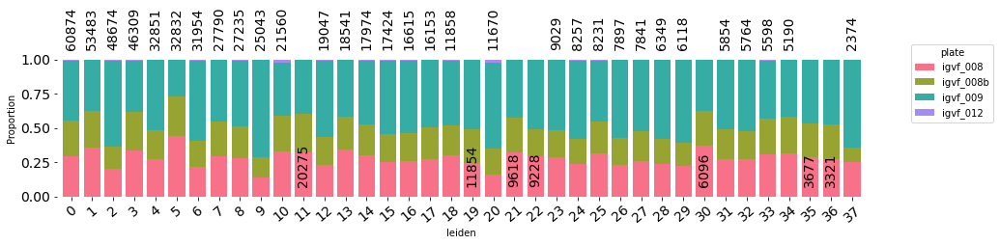

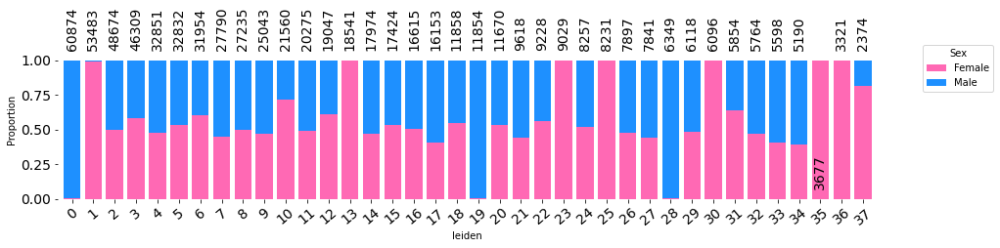

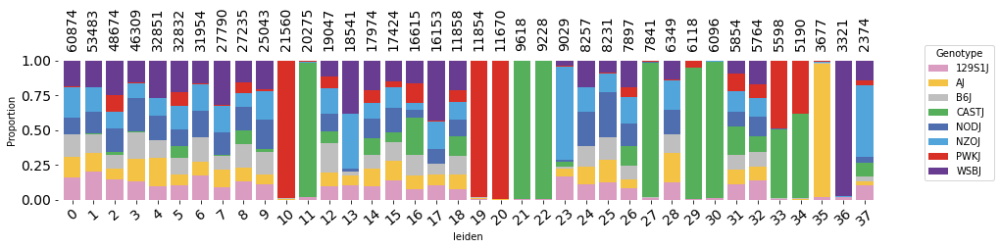

In [5]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=False, fsize = (15,3), 
                            annotations = True)

pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Sex',
                            flip=False, fsize = (15,3), 
                            annotations = True)

pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = True)



In [6]:
# adjust mouse_tissue_id
# sample genotypes for each 'Multiplexed_sampleN'
ms1 = ['B6J','AJ','WSBJ','129S1J']
ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# Define a function to update 'Mouse_Tissue_ID' based on conditions
def update_mouse_tissue_id(row):
    if row['plate'] != 'igvf_012' and row['Column'] in [9.0, 10.0, 11.0, 12.0]:
        if row['Genotype'] in ms1:
            return row['Multiplexed_sample1']
        elif row['Genotype'] in ms2:
            return row['Multiplexed_sample2']
    return row['Mouse_Tissue_ID']


# Apply the function to update the 'Mouse_Tissue_ID' column
adata.obs['Mouse_Tissue_ID'] = adata.obs.apply(update_mouse_tissue_id, axis=1)

In [7]:
df = adata.obs[['Mouse_Tissue_ID','Estrus_cycle','plate']]
df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
df['Estrus_cycle'] = df['Estrus_cycle'].astype('str').replace('nan', 'NA')
df['Estrus_cycle'].value_counts()
adata.obs['Estrus_cycle'] = df['Estrus_cycle']


/tmp/ipykernel_480052/713815631.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
/tmp/ipykernel_480052/713815631.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
/tmp/ipykernel_480052/713815631.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_

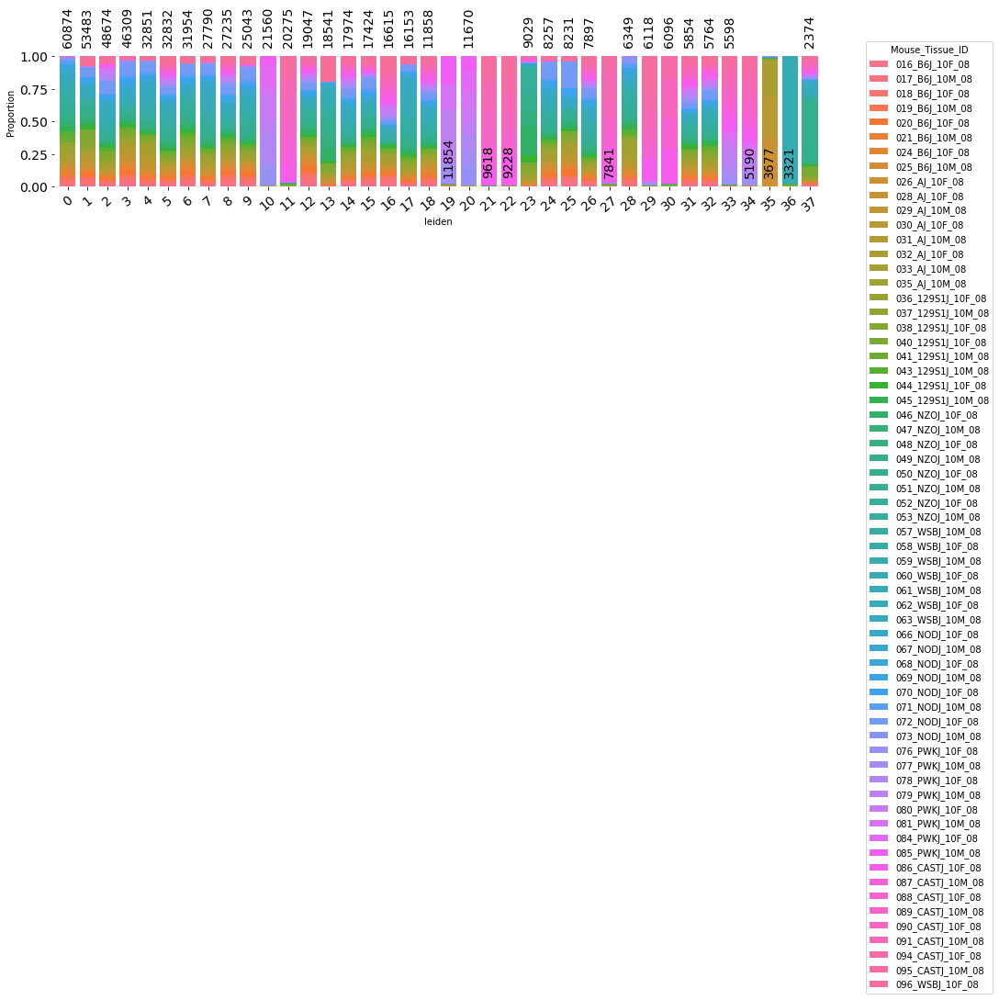

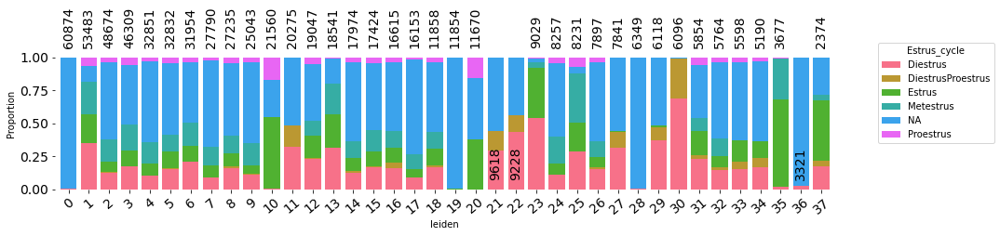

In [12]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Mouse_Tissue_ID',
                            flip=False, fsize = (15,3), 
                            annotations = True)



pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Estrus_cycle',
                            flip=False, fsize = (15,3), 
                            annotations = True)

In [14]:
adata.obs[adata.obs['leiden'] == "36"]['Mouse_Tissue_ID'].value_counts()

Mouse_Tissue_ID
060_WSBJ_10F_08      3209
038_129S1J_10F_08      53
058_WSBJ_10F_08        35
048_NZOJ_10F_08        14
088_CASTJ_10F_08        4
044_129S1J_10F_08       3
062_WSBJ_10F_08         2
037_129S1J_10M_08       1
Name: count, dtype: int64

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


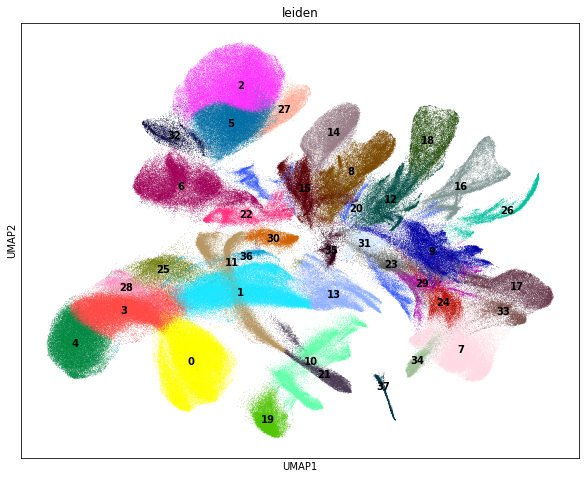

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


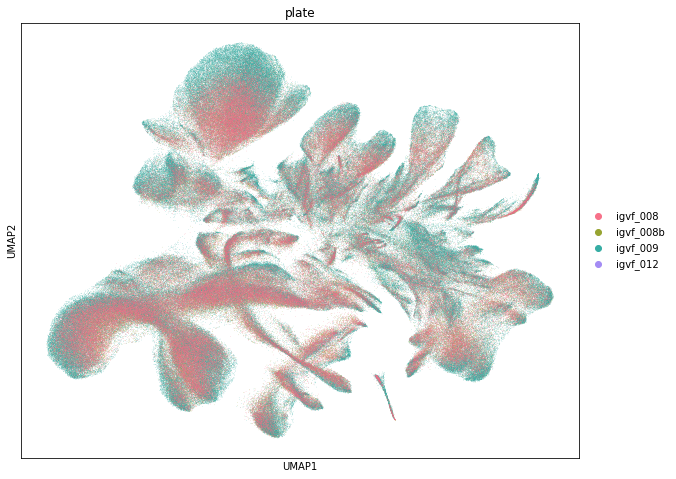

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


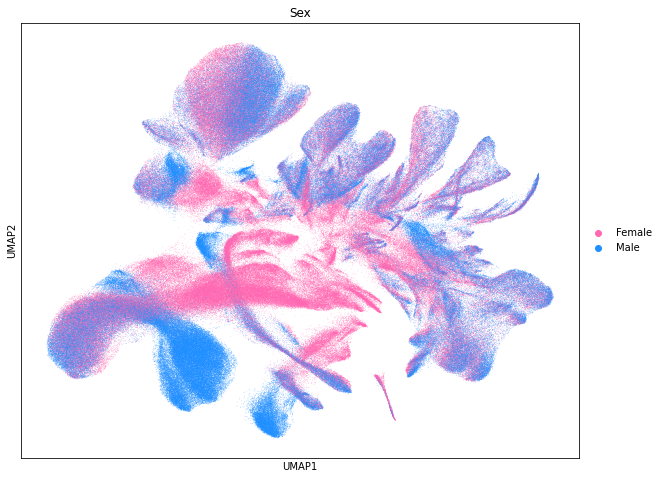

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


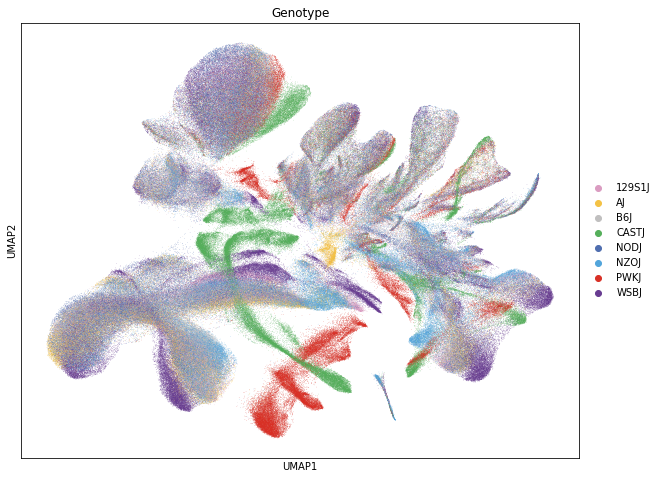

In [15]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Sex'], size = 0.8, palette = sex_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)



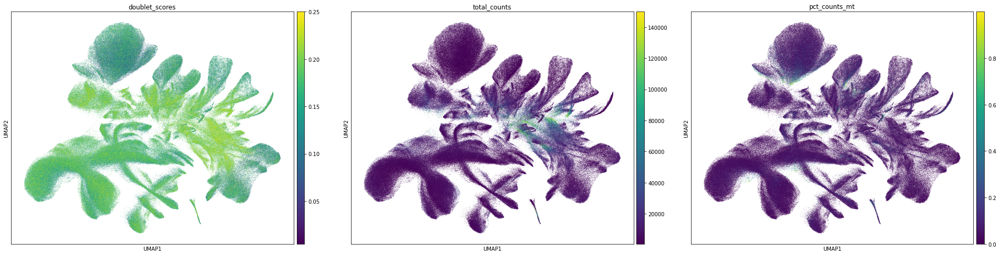

In [16]:
sc.pl.umap(adata, color=['doublet_scores','total_counts','pct_counts_mt'], size=1)


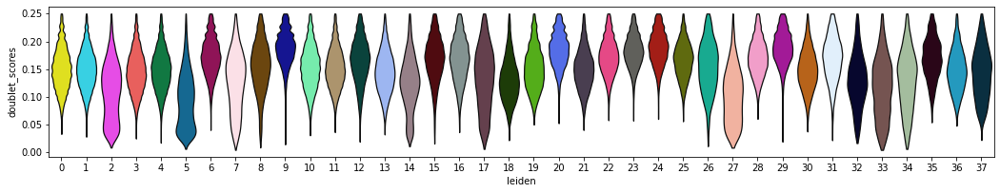

In [17]:
plt.rcParams['figure.figsize'] = (14, 3)

sc.pl.violin(adata, ['doublet_scores'],
             groupby = "leiden", #palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

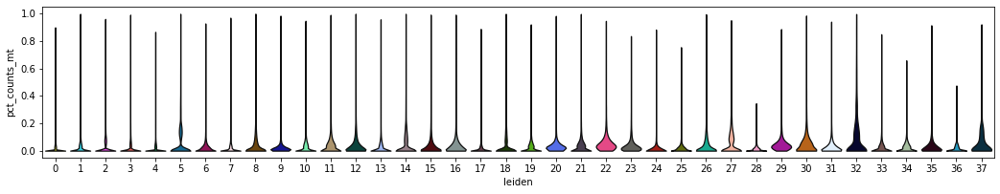

In [18]:
plt.rcParams['figure.figsize'] = (14, 3)

sc.pl.violin(adata, ['pct_counts_mt'],
             groupby = "leiden", #palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

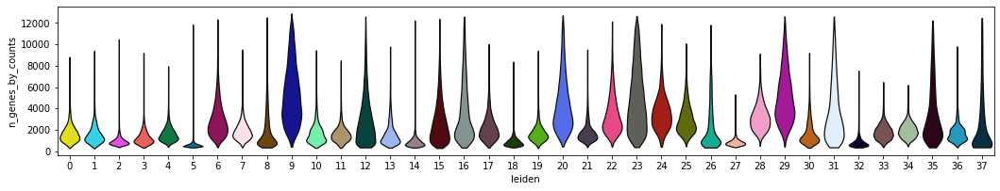

In [19]:
plt.rcParams['figure.figsize'] = (14, 3)

sc.pl.violin(adata, ['n_genes_by_counts'],
             groupby = "leiden", #palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

# Check marker gene expression

In [29]:
adata.var_names  = adata.var['gene_name']


In [8]:
marker_genes_dict = {
    "Adipocyte": ["Acsl1","Pparg","Adipoq","Pnpla2"],
    "Capsule": ["Rspo1","Igfbp5","Wt1"],
    "Endothelial": ["Tek","Flt1","Pecam1"],
    "Lymphatic_endothelial": ["Prox1","Flt4"],
    "Fibroblast":["Postn","Dcn","Col1a1","Col1a2"],
    "Circulating hepatoblast":["Alb","Serpina1a","Ttr","Cyp2b9","Ces1c"],
    "Macrophage": ["F13a1","Csf1r","Cd86"],
    "Lymphocyte": ["Ptprc","Ikzf1","Bcl11a","Themis","Il7r"],
    "Smooth_muscle": ["Myh11","Acta2","Tagln","Myl6"],
    "Skeletal_muscle": ["Mybpc1","Ttn","Ckm","Neb"],
    "Stromal": ["Pdgfra","Cyp1b1","Mgp"],
    "Sox10": ["Sox10","Mpz"],
    "Medulla": ["Chga","Th","Pnmt"],
    "Cortex_ZG": ["Cyp11b2","Dab2"],
    "Cortex_ZF": ["Cyp11b1","Nr5a1","Cyp11a1","Star"],
    "X_zone": ["Pik3c2g","Thrb","Akr1c18","Runx2","Ar"],
    "Cycling": ["Top2a","Mki67"]
}



categories: 0, 1, 2, etc.
var_group_labels: Adipocyte, Capsule, Endothelial, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


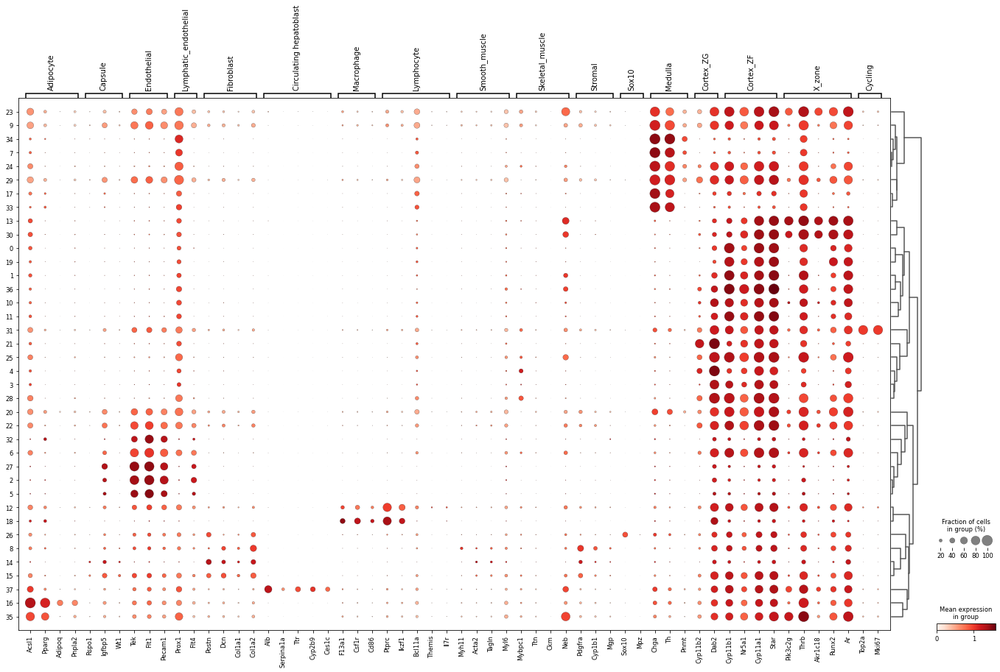

In [33]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


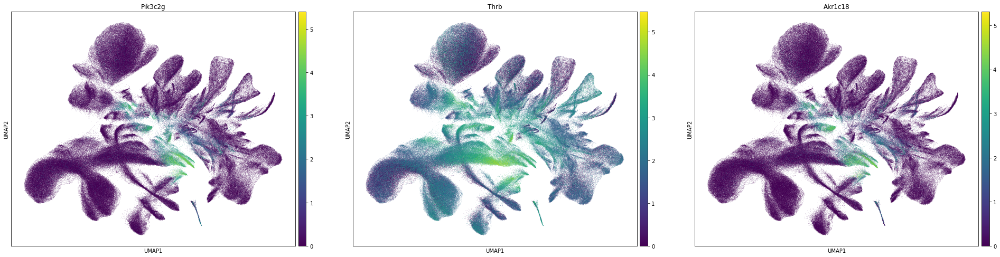

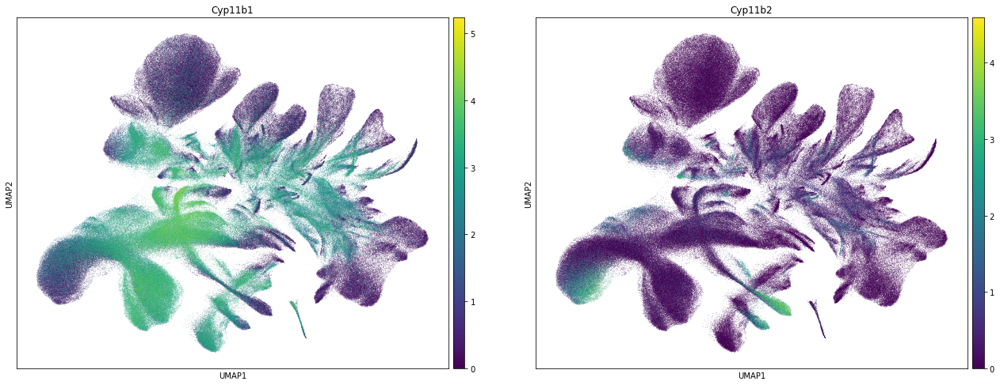

In [15]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['Pik3c2g','Thrb','Akr1c18'], size = 0.8, sort_order = True)
sc.pl.umap(adata, color=['Cyp11b1','Cyp11b2'], size = 0.8, sort_order = True)



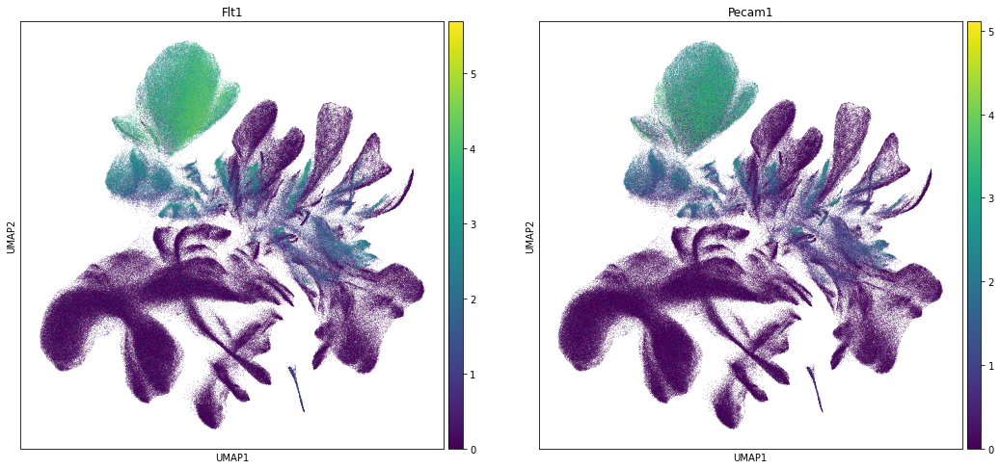

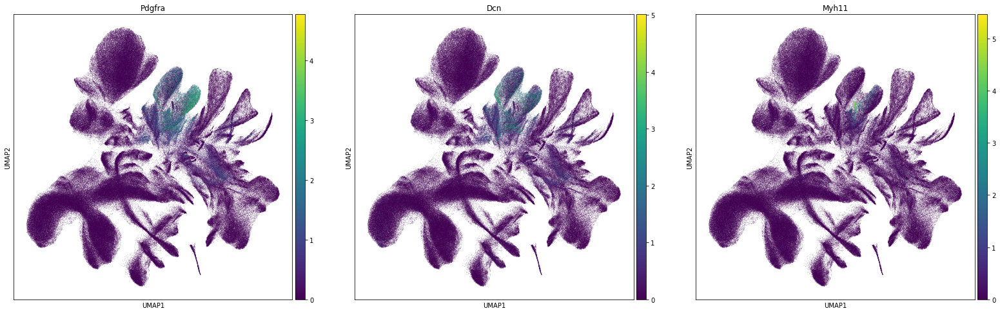

In [30]:
sc.pl.umap(adata, color=['Flt1','Pecam1'], size = 0.8, sort_order = True)
sc.pl.umap(adata, color=['Pdgfra','Dcn','Myh11'], size = 0.8, sort_order = True)


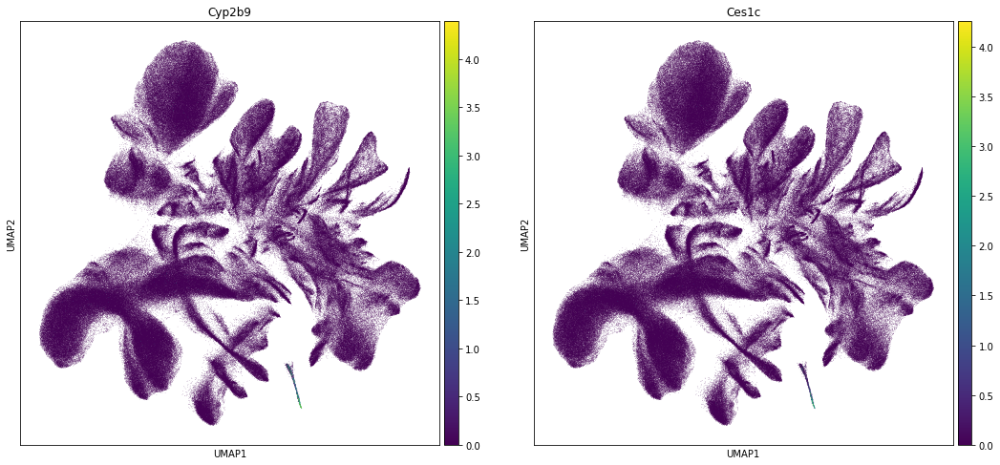

In [31]:
sc.pl.umap(adata, color=['Cyp2b9','Ces1c'], size = 0.8, sort_order = True)


# Label transfer from ENC4 Parse 2mo data


## Prepare reference

In [ ]:
adr_data = sc.read_mtx("/dfs5/bio/erebboah/snrna/adrenal/seurat/adrenal_all_genes.mtx")
  
adr_obs = pd.read_csv("/dfs5/bio/erebboah/snrna/adrenal/seurat/adrenal_Parse_10x_integrated_metadata.csv")
adr_obs = adr_obs[['cellID', 'tissue', 'technology','timepoint','celltypes', 'subtypes']]

adr_var = pd.read_csv("/dfs5/bio/erebboah/snrna/adrenal/seurat/adrenal_seurat_genes.csv", index_col = 0)
adr_var.columns = ["gene_name"]

X = adr_data.X
X = X.T
ref_data = anndata.AnnData(X=X, obs=adr_obs, var=adr_var)
ref_data.obs.index = adr_obs["cellID"]
ref_data.var_names  = ref_data.var['gene_name']
ref_data.layers["raw_counts"] = ref_data.X.copy()


## Merge and preprocess

In [ ]:
adata.var_names  = adata.var['gene_name']


In [ ]:
adata.obs['batch'] = 'query'
ref_data.obs['batch'] = 'reference'


In [ ]:
adata = adata.concatenate(ref_data)


In [ ]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata


In [ ]:
sc.pp.highly_variable_genes(adata, flavor = 'seurat_v3', n_top_genes=2000,
                            layer = "raw_counts", batch_key="batch", subset = True)



# Run scvi

In [ ]:
scvi.model.SCVI.setup_anndata(adata, layer = 'raw_counts', batch_key='batch')
vae = scvi.model.SCVI(adata)
vae.train()


In [ ]:
adata.obs['subtypes'] = adata.obs['subtypes'].astype('category')

adata.obs['subtypes'] = adata.obs['subtypes'].cat.add_categories('Unknown')
adata.obs = adata.obs.fillna(value = {'subtypes': 'Unknown'})



In [ ]:
lvae = scvi.model.SCANVI.from_scvi_model(vae, adata = adata, unlabeled_category = 'Unknown',
                                        labels_key = 'subtypes')

lvae.train(max_epochs=20, n_samples_per_label=100)

adata.obs['predictions'] = lvae.predict(adata)


In [ ]:
adata.obs['cell_barcodes'] = adata.obs.index.map(lambda x: x[:-2])

cell_mapper = dict(zip(adata.obs.cell_barcodes, adata.obs.predictions))

## Map back onto original adata

In [ ]:
adata = sc.read('../IGVF_analysis/annotated_tissues/Adrenal_filtered.h5ad')


In [ ]:
adata.obs['predictions'] = adata.obs.index.map(cell_mapper)


In [ ]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/Adrenal_filtered.h5ad')


In [20]:
adata = sc.read('../IGVF_analysis/annotated_tissues/Adrenal_filtered.h5ad')


In [21]:
plt.rcParams['figure.figsize'] = (10, 8)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


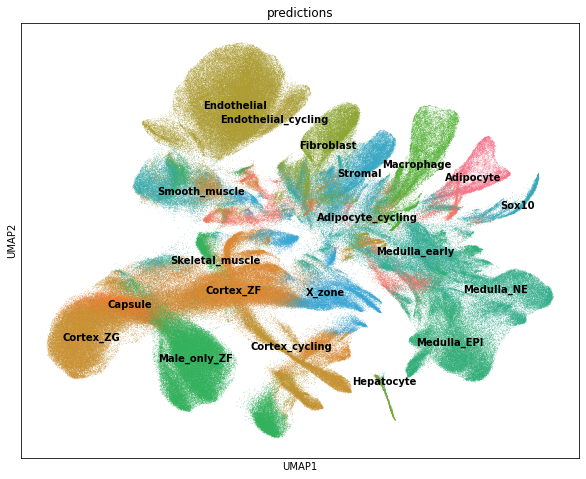

In [22]:
color_palette = sns.color_palette("husl", n_colors=30)

sc.pl.umap(adata, color=['predictions'], size=1, legend_loc = 'on data',palette=color_palette)



/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


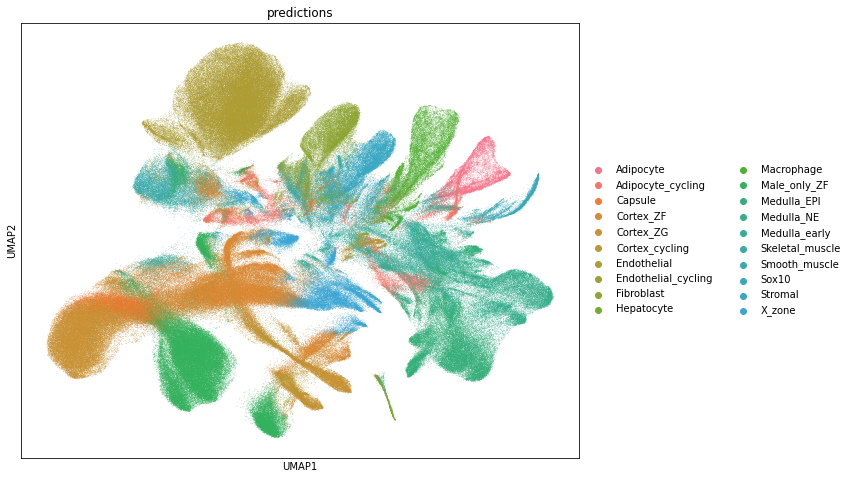

In [23]:
sc.pl.umap(adata, color=['predictions'], size=1, palette=color_palette)


In [24]:
obs = adata.obs

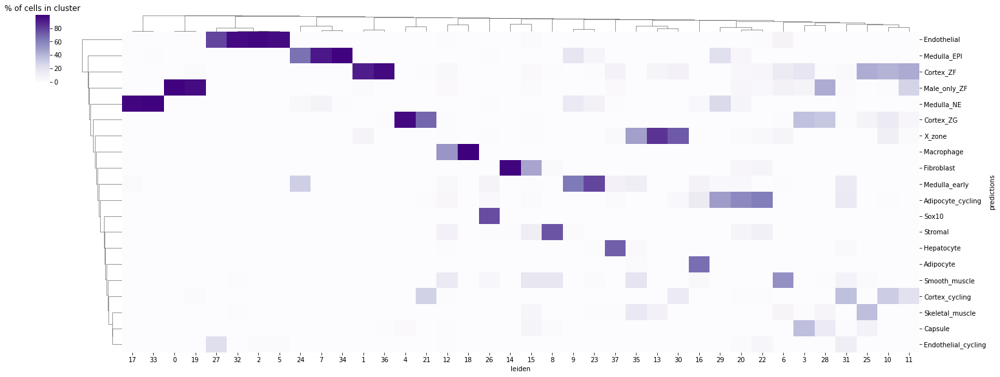

In [25]:
confusion_matrix_df = pd.crosstab(obs['leiden'], obs['predictions'])
confusion_matrix_df_percentage = confusion_matrix_df.div(confusion_matrix_df.sum(axis=1), axis=0) * 100
confusion_matrix_df_percentage_transposed = confusion_matrix_df_percentage.transpose()

sns.clustermap(confusion_matrix_df_percentage_transposed, 
               cmap='Purples',
               dendrogram_ratio=0.05,
               cbar_pos=(-0.04, 0.8, 0.015, 0.18),
               cbar=True,
               method='average', 
               metric='euclidean', 
               figsize=(20, 8), 
               col_cluster=True, 
               row_cluster=True)
plt.title('% of cells in cluster')
plt.show()

# Get Ryan's annotations

In [ ]:
adata = sc.read('../IGVF_analysis/annotated_tissues/Adrenal_filtered.h5ad')


In [ ]:
ref_adata = sc.read("../IGVF_analysis/annotated_tissues/ryan_annotations/Adrenal_annotated.h5ad")
ref_adata.obs['cell_barcodes'] = ref_adata.obs.index

cell_mapper = dict(zip(ref_adata.obs.cell_barcodes, ref_adata.obs.cell_types))

adata.obs['ryan_annotations'] = adata.obs.index.map(cell_mapper)


In [ ]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/Adrenal_filtered.h5ad')


In [3]:
adata = sc.read('../IGVF_analysis/annotated_tissues/Adrenal_filtered.h5ad')


In [ ]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['ryan_annotations'], size=1, legend_loc = 'on data')


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


# Subcluster
- Cluster 10, PWK cortex to get ZG
- Cluster 11, CAST cortex to get male ZF


In [34]:
sc.tl.leiden(adata, restrict_to = ('leiden',['10','11']), resolution = 0.4)
adata.obs['leiden_R'] = adata.obs['leiden_R'].str.replace(',', '_')



/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


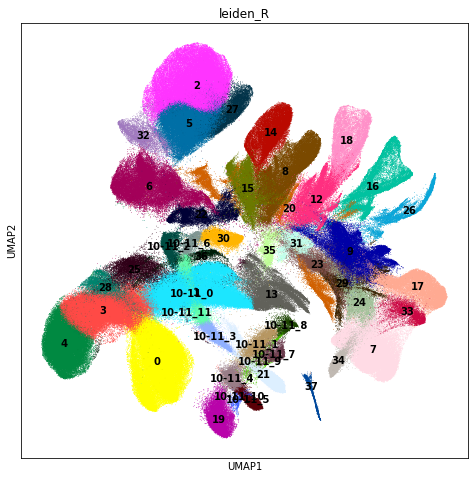

In [35]:
plt.rcParams['figure.figsize'] = (8, 8)

sc.pl.umap(adata, color=['leiden_R'], size=2,legend_loc = 'on data')



/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


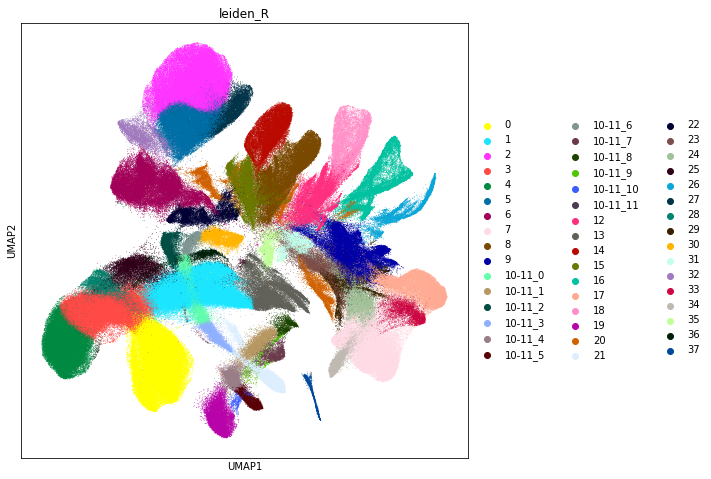

In [36]:
sc.pl.umap(adata, color=['leiden_R'], size=2)


categories: 0, 1, 2, etc.
var_group_labels: Adipocyte, Capsule, Endothelial, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


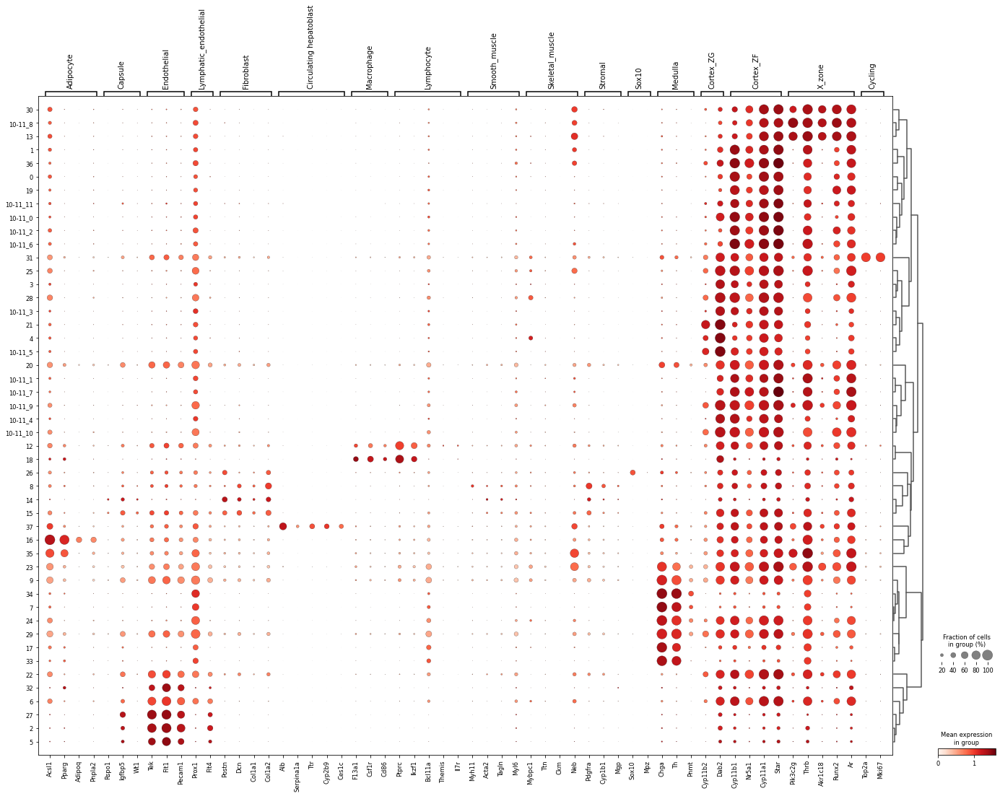

In [37]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden_R', mean_only_expressed = True,
              dendrogram=True, log=True)


# Assign celltypes to clusters

In [4]:
annots = pd.read_csv("Adrenal_annotations.csv")
annots['leiden_R'] = annots['leiden_R'].astype(str)

annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['general_celltype'].to_dict()
adata.obs['general_celltype'] = adata.obs['leiden_R'].map(annotation_dict)
annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['general_CL_ID'].to_dict()
adata.obs['general_CL_ID'] = adata.obs['leiden_R'].map(annotation_dict)

annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['celltype'].to_dict()
adata.obs['celltype'] = adata.obs['leiden_R'].map(annotation_dict)
annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['CL_ID'].to_dict()
adata.obs['CL_ID'] = adata.obs['leiden_R'].map(annotation_dict)

annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['subtype'].to_dict()
adata.obs['subtype'] = adata.obs['leiden_R'].map(annotation_dict)



/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


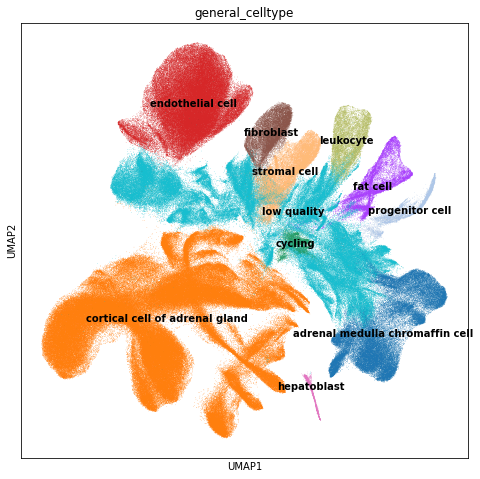

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


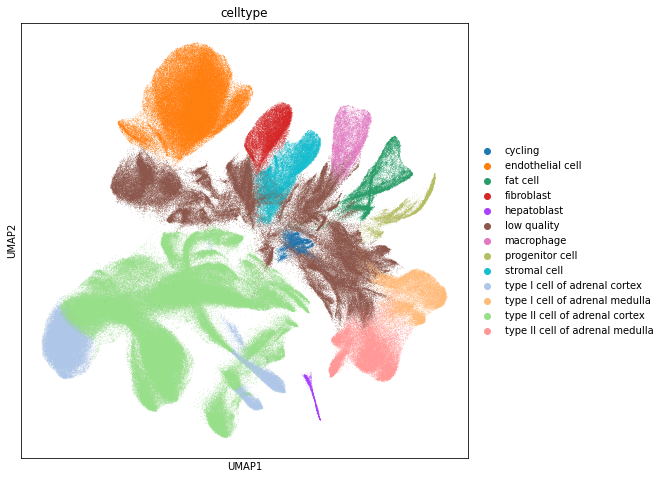

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


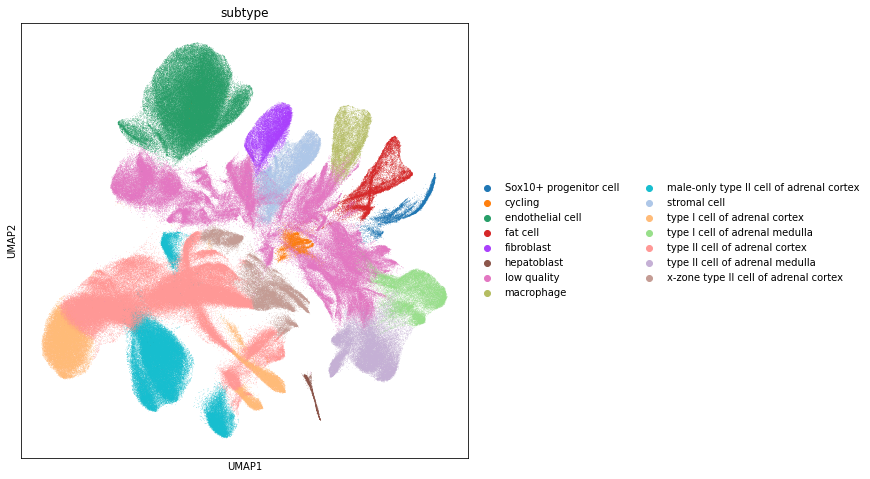

In [13]:
plt.rcParams['figure.figsize'] = (8, 8)

sc.pl.umap(adata, color=['general_celltype'], size=1, legend_loc = 'on data')
sc.pl.umap(adata, color=['celltype'], size=1)#, legend_loc = 'on data')
sc.pl.umap(adata, color=['subtype'], size=1)#, legend_loc = 'on data')


categories: Sox10+ progenitor cell, cycling, endothelial cell, etc.
var_group_labels: Adipocyte, Capsule, Endothelial, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


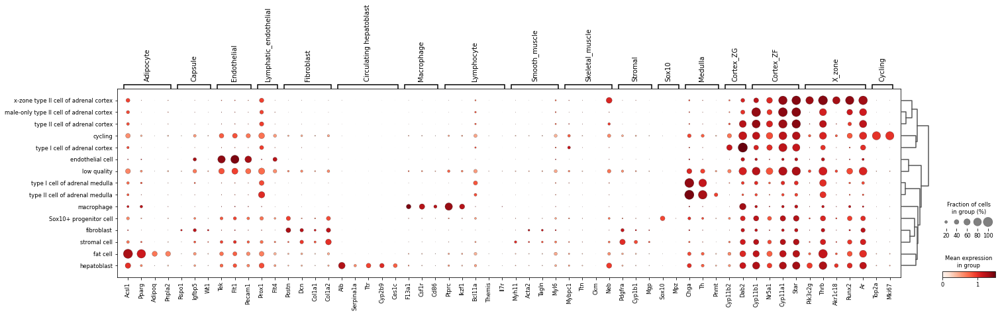

In [9]:
sc.tl.dendrogram(adata, groupby = 'subtype')
sc.pl.dotplot(adata, marker_genes_dict, 'subtype', mean_only_expressed = True,
              dendrogram=True, log=True)


# Save annotated adata

In [11]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/Adrenal_annotated.h5ad')


In [10]:
meta = adata.obs
meta.to_csv(f"../IGVF_analysis/annotated_tissues/Adrenal_annotated_metadata.csv")


In [2]:
tissue = "Adrenal"
adata = sc.read(f"../IGVF_analysis/annotated_tissues/{tissue}_annotated.h5ad")
a

NameError: name 'a' is not defined

In [3]:
adata.layers

Layers with keys: raw_counts

# Pseudobulk PCA

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
import anndata
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import random


<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [19]:
tissue = "Adrenal"
adata = sc.read(f"../IGVF_analysis/annotated_tissues/{tissue}_annotated.h5ad")
adata = adata[(adata.obs['Genotype'] != "tie")]
adata = adata[~adata.obs['celltype'].isin(["low quality"])]


In [20]:
adata.obs['Mouse_Tissue_ID'] = adata.obs['Mouse_Tissue_ID'].astype(str)


/tmp/ipykernel_3420923/2200752215.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Mouse_Tissue_ID'] = adata.obs['Mouse_Tissue_ID'].astype(str)


In [21]:
# adjust mouse_tissue_id
ms1 = ['B6J','AJ','WSBJ','129S1J']
ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# Define a function to update 'Mouse_Tissue_ID' based on conditions
def update_mouse_tissue_id(row):
    if row['plate'] != 'igvf_012' and row['Column'] in [9, 10, 11, 12]:
        if row['Genotype'] in ms1:
            return row['Multiplexed_sample1']
        elif row['Genotype'] in ms2:
            return row['Multiplexed_sample2']
    return row['Mouse_Tissue_ID']

meta = adata.obs

# Apply the function to update the 'Mouse_Tissue_ID' column
meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)
adata.obs['Mouse_Tissue_ID'] = meta['Mouse_Tissue_ID']


In [22]:
import decoupler as dc

pdata = dc.get_pseudobulk(
    adata,
    sample_col='Mouse_Tissue_ID',
    groups_col=None,
    obs=adata.obs,
    layer='raw_counts',
    mode='sum',
    min_cells=10,
    min_counts=10000
)


In [23]:
for c in pdata.obs.columns:
        if pd.api.types.is_object_dtype(pdata.obs[c].dtype):
            pdata.obs[c] = pdata.obs[c].fillna('NA')

In [25]:
pdata

AnnData object with n_obs × n_vars = 64 × 47290
    obs: 'Mouse_Tissue_ID', 'Chemistry', 'Genotype', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Age_weeks', 'Dissector', 'psbulk_n_cells', 'psbulk_counts'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    layers: 'psbulk_props'

In [24]:
pdata.write_h5ad(f'../IGVF_analysis/pseudobulk/{tissue}_pseudobulk_raw.h5ad')

In [26]:
sc.pp.normalize_total(pdata, target_sum=1e4) # Counts per 10k
sc.pp.log1p(pdata)

sc.tl.pca(pdata, svd_solver='arpack', use_highly_variable = False)



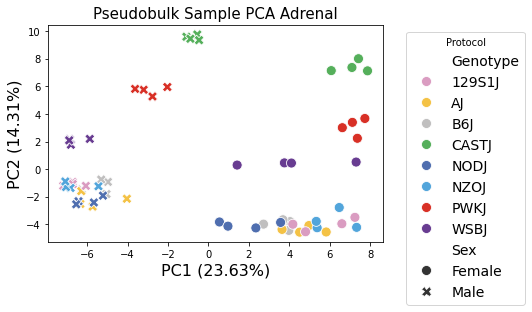

In [27]:
df = pd.DataFrame(pdata.obsm["X_pca"])
meta  = pdata.obs
df.set_index(meta['Mouse_Tissue_ID'], inplace=True)
merged_df = pd.merge(df, meta, left_index=True, right_on='Mouse_Tissue_ID')


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


sns.scatterplot(x=merged_df.iloc[:, 0], y=merged_df.iloc[:, 1], 
                hue=merged_df['Genotype'], 
                style=merged_df['Sex'], 
                s=100, 
                palette=geno_palette,
                alpha=1)  # Adjust transparency if needed

plt.xlabel("PC1", fontsize=16)
plt.ylabel("PC2", fontsize=16)
plt.title(f'Pseudobulk Sample PCA {tissue}', fontsize=15)

plt.legend(title='Protocol', fontsize=14, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
pc1 = pdata.uns["pca"]["variance_ratio"][0]
pc2 = pdata.uns["pca"]["variance_ratio"][1]
plt.xlabel(f"PC1 ({pc1:.2%})", fontsize=16)
plt.ylabel(f"PC2 ({pc2:.2%})", fontsize=16)


plt.show()


# Pseudobulk subtype expression

In [1]:
import scanpy as sc
import decoupler as dc
import pandas as pd

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
tissue = "Adrenal"
adata = sc.read(f"../IGVF_analysis/tissue_processed_500umi/{tissue}_processed.h5ad")


In [3]:
meta = pd.read_csv(f"../IGVF_analysis/annotated_tissues/{tissue}_annotated_metadata.csv")
cell_mapper = dict(zip(meta['cellID'], meta['subtype']))

adata.obs['subtype'] = adata.obs.index.map(cell_mapper)


/tmp/ipykernel_3320444/3082366883.py:1: DtypeWarning: Columns (11,12,13,21,22,23,31,35,36,37,40,41,42) have mixed types. Specify dtype option on import or set low_memory=False.
  meta = pd.read_csv("../IGVF_analysis/annotated_tissues/Adrenal_annotated_metadata.csv")


In [4]:
mask = ~adata.obs['subtype'].isna()
adata = adata[mask]


In [5]:
pdata = dc.get_pseudobulk(
    adata,
    sample_col="subtype",
    groups_col=None,
    obs=adata.obs,
    layer='raw_counts',
    mode='sum',
    min_cells=10,
    min_counts=10000
)

In [10]:
for c in pdata.obs.columns:
        if pd.api.types.is_object_dtype(pdata.obs[c].dtype):
            pdata.obs[c] = pdata.obs[c].fillna('NA')

In [11]:
pdata.write_h5ad(f'../IGVF_analysis/pseudobulk/{tissue}_pseudobulk_subtype_sum.h5ad')


In [12]:
pdata = dc.get_pseudobulk(
    adata,
    sample_col="subtype",
    groups_col=None,
    obs=adata.obs,
    layer='raw_counts',
    mode='median',
    min_cells=10,
    min_counts=10000
)

for c in pdata.obs.columns:
        if pd.api.types.is_object_dtype(pdata.obs[c].dtype):
            pdata.obs[c] = pdata.obs[c].fillna('NA')
            
pdata.write_h5ad(f'../IGVF_analysis/pseudobulk/{tissue}_pseudobulk_subtype_median.h5ad')


In [18]:
pdata = dc.get_pseudobulk(
    adata,
    sample_col="subtype",
    groups_col=None,
    obs=adata.obs,
    layer='raw_counts',
    mode='mean',
    min_cells=10,
    min_counts=10000
)

for c in pdata.obs.columns:
        if pd.api.types.is_object_dtype(pdata.obs[c].dtype):
            pdata.obs[c] = pdata.obs[c].fillna('NA')
            
pdata.write_h5ad(f'../IGVF_analysis/pseudobulk/{tissue}_pseudobulk_subtype_mean.h5ad')
